In [61]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go


import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
import pmdarima as pm
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error


#Using model ARIMA

In [62]:


# Đọc dữ liệu từ tệp CSV
df = pd.read_csv('FPT.csv')

# Chuyển đổi cột 'Date/Time' sang định dạng datetime
df['Date/Time'] = pd.to_datetime(df['Date/Time'])

# Tạo cột mới 'Date' chỉ lấy ngày
df['Date'] = df['Date/Time'].dt.date
df['Date'] = pd.to_datetime(df['Date'])
df.sort_values(by='Date', inplace=True)

# Lọc ra các ngày hợp lệ
valid_dates = df[(df['Date'] >= pd.Timestamp.min) & (df['Date'] <= pd.Timestamp.max)]

# Gộp dữ liệu theo cột 'Date' và tính trung bình cho cột 'Adj Close'
fpt_data = valid_dates.groupby('Date').agg({
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last',
    'Volume': 'sum',
    'Open Interest': 'sum'
}).reset_index()

fpt_data['Volatility'] = fpt_data['Close'].shift(-1) - fpt_data['Close']


# In ra dữ liệu đã gộp
print(fpt_data.head(10))


        Date   Open   High    Low  Close  Volume  Open Interest  Volatility
0 2018-12-25  30.89  30.89  30.59  30.66   84960              0        0.45
1 2018-12-26  30.96  31.22  30.89  31.11  333590              0        0.23
2 2018-12-27  31.34  31.52  31.19  31.34  454860              0       -0.08
3 2018-12-28  31.34  31.49  31.19  31.26  387170              0       -0.04
4 2019-01-02  31.19  31.45  30.70  31.22  459120              0       -0.59
5 2019-01-03  30.52  30.93  30.37  30.63  716600              0       -0.30
6 2019-01-04  30.59  30.93  30.22  30.33  318570              0        0.97
7 2019-01-07  31.15  31.41  31.04  31.30  408470              0       -0.08
8 2019-01-08  31.19  31.34  31.11  31.22  295660              0        0.41
9 2019-01-09  31.63  31.78  31.26  31.63  309040              0       -0.11


In [63]:
fpt_data.describe()

,Date,Open,High,Low,Close,Volume,Open Interest,Volatility
count,499,499.000000,499.000000,499.000000,499.000000,4.990000e+02,499.0,498.000000
mean,2019-12-28 19:48:56.272545024,44.353387,44.756633,43.906994,44.353687,1.570242e+06,0.0,0.055100
min,2018-12-25 00:00:00,30.520000,30.890000,30.220000,30.330000,8.496000e+04,0.0,-3.330000
25%,2019-07-02 12:00:00,38.130000,38.590000,37.900000,38.300000,9.206850e+05,0.0,-0.300000
50%,2019-12-25 00:00:00,46.550000,47.000000,46.090000,46.550000,1.339560e+06,0.0,0.060000
75%,2020-06-29 12:00:00,49.080000,49.500000,48.570000,49.000000,2.004005e+06,0.0,0.430000
max,2020-12-22 00:00:00,57.700000,58.500000,57.200000,58.100000,6.853810e+06,0.0,2.940000
std,NaN,6.767734,6.823155,6.689798,6.776178,9.530781e+05,0.0,0.721071


In [64]:
fpt_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499 entries, 0 to 498
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           499 non-null    datetime64[ns]
 1   Open           499 non-null    float64       
 2   High           499 non-null    float64       
 3   Low            499 non-null    float64       
 4   Close          499 non-null    float64       
 5   Volume         499 non-null    int64         
 6   Open Interest  499 non-null    int64         
 7   Volatility     498 non-null    float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 31.3 KB


In [65]:
fig = go.Figure(data=[go.Candlestick(x=df['Date/Time'],
                open=df['Open'],
                high=df['High'],
                low=df['Low'],
                close=df['Close'])])

# Cài đặt tiêu đề và nhãn trục
fig.update_layout(
    title='Biểu đồ Candlestick cho dữ liệu giá cổ phiếu',
    xaxis_title='Ngày',
    yaxis_title='Giá'
)

# Hiển thị biểu đồ
fig.show()

In [66]:

r_t = np.log(fpt_data['Close']/fpt_data['Close'].shift(1)).values



In [67]:
#Fill giá trị np.nan bằng trung bình chuỗi.
mean = np.nanmean(r_t)
r_t[0]=mean
r_t[:5]


array([ 0.00128355,  0.01457044,  0.00736593, -0.00255591, -0.00128041])

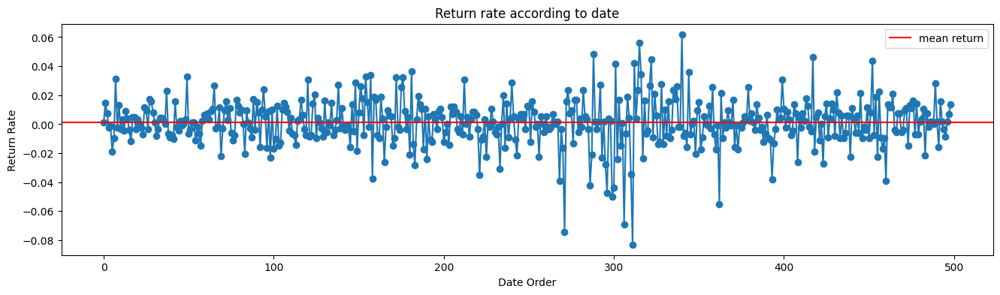

In [68]:
#Biểu đồ lợi suất:
plt.figure(figsize=(16, 4))
plt.plot(np.arange(r_t.shape[0]), r_t, '-o')
plt.axhline(y=mean, label='mean return', c='red')
plt.title('Return rate according to date')
plt.xlabel('Date Order')
plt.ylabel('Return Rate')
plt.legend()
plt.show()

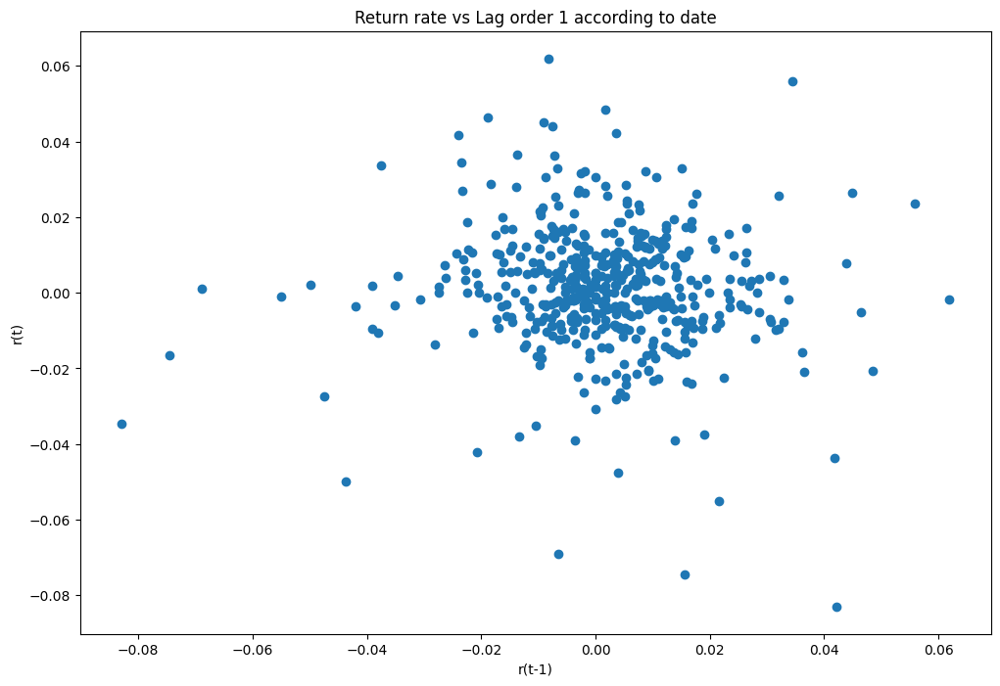

In [69]:
# Kiểm tra quan hệ tuyến tính hay ngẫu nhiên
plt.figure(figsize=(12, 8))
plt.scatter(x=r_t[1:], y=r_t[:-1])
plt.title('Return rate vs Lag order 1 according to date')
plt.xlabel('r(t-1)')
plt.ylabel('r(t)')
plt.show()

Text(0, 0.5, 'frequency')

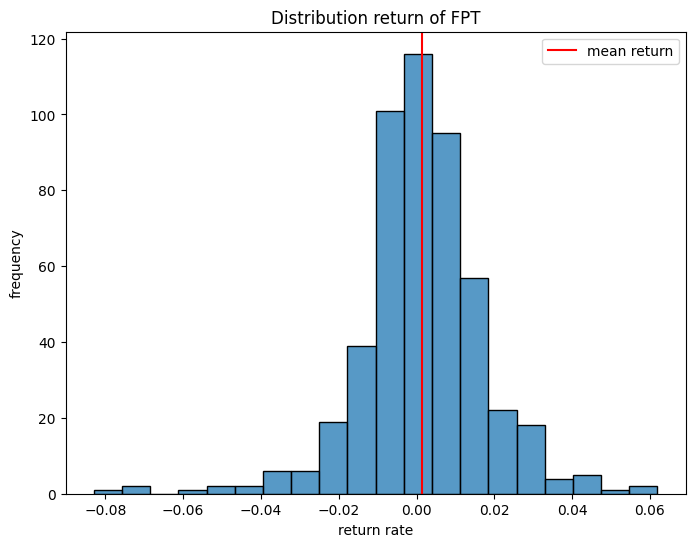

In [70]:
# biểu đồ phân phối xác suất của chuỗi lợi suất
plt.figure(figsize = (8, 6))
sns.histplot(r_t, bins = 20)
plt.axvline(x=mean, label='mean return', c='red')
plt.title('Distribution return of FPT')
plt.legend()
plt.xlabel('return rate')
plt.ylabel('frequency')

In [71]:
#Kiểm định ADF cho chuỗi lợi suất.
result = adfuller(r_t)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
	print('\t%s: %.3f' % (key, value))


ADF Statistic: -23.635711
p-value: 0.000000
Critical Values:
	1%: -3.444
	5%: -2.867
	10%: -2.570


Gía trị p-value < 0.05 do đó chuỗi lợi suất có tính chất dừng. --> d = 0

<Figure size 800x600 with 0 Axes>

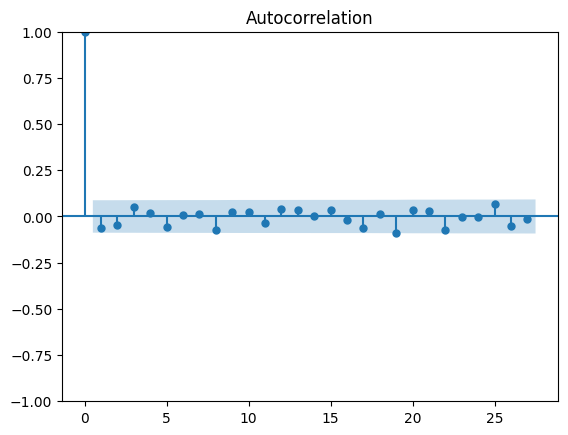

In [72]:
# Biểu đồ các hệ số tự tương quan ACF
plt.figure(figsize = (8, 6))
ax1 = plot_acf(r_t)

<Figure size 800x600 with 0 Axes>

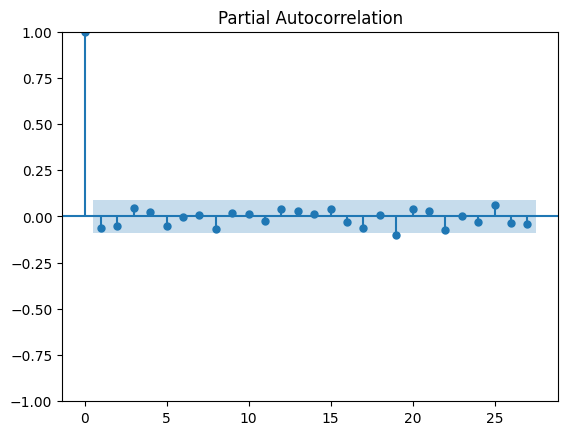

In [73]:
# Biểu đồ PACF về giá trị các hệ số tương quan riêng phần tương ứng với các độ trễ khác nhau
plt.figure(figsize = (8, 6))
ax2 = plot_pacf(r_t)

In [74]:
model_sarima = pm.auto_arima(r_t, start_p=0, start_q=0,
                           max_p=5, max_q=5, m=12,
                           start_P=0, seasonal=False,
                           d=0, D=0, trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)

print(model_sarima.aic())

c:\Users\chihi\AppData\Local\Programs\Python\Python311\Lib\site-packages\pmdarima\arima\_validation.py:62: UserWarning:

m (12) set for non-seasonal fit. Setting to 0



Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-2693.040, Time=0.07 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-2692.467, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-2692.590, Time=1.38 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-2690.522, Time=1.21 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=-2694.161, Time=0.09 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-2693.955, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-2694.138, Time=0.62 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-2692.333, Time=0.48 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 4.047 seconds
-2694.1609597540214


In [75]:
model_sarima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  499
Model:                        SARIMAX   Log Likelihood                1349.080
Date:                Sat, 13 Apr 2024   AIC                          -2694.161
Time:                        09:31:45   BIC                          -2685.736
Sample:                             0   HQIC                         -2690.855
                                - 499                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0013      0.001      1.726      0.084      -0.000       0.003
sigma2         0.0003   1.01e-05     26.064      0.000       0.000       0.000
===================================================================================
Ljung-Box (L1) (Q):                   1.80   Jarque-Bera (JB):               311.12
Prob(Q):                              0.18   Prob(JB):                         0.00
Heteroskedasticity (H):               1.43   Skew:                            -0.53
Prob(H) (two-sided):                  0.02   Kurtosis:                         6.72
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [76]:
#khai báo bậc của mô hình ARIMA
model_arima = ARIMA(r_t, order = (0, 0, 0))
model_fit = model_arima.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  499
Model:                          ARIMA   Log Likelihood                1349.080
Date:                Sat, 13 Apr 2024   AIC                          -2694.161
Time:                        09:31:46   BIC                          -2685.736
Sample:                             0   HQIC                         -2690.855
                                - 499                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0013      0.001      1.720      0.085      -0.000       0.003
sigma2         0.0003   1.01e-05     26.066      0.000       0.000       0.000
Ljung-Box (L1) (Q):                   1.80   Jarque-

c:\Users\chihi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



Đưa ra dự đoán chuỗi thời gian

C:\Users\chihi\AppData\Local\Temp\ipykernel_8012\480126800.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



data frame shape:  (499, 1)


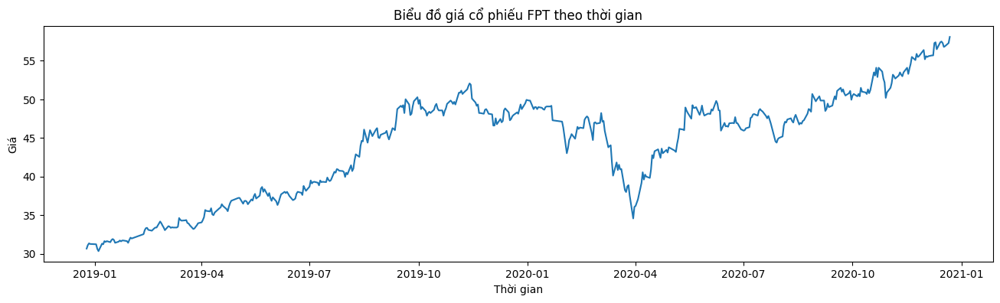

In [77]:
df_season = fpt_data[['Date', 'Close']]

# Đảm bảo 'Date' cột là kiểu dữ liệu datetime
df_season['Date'] = pd.to_datetime(df_season['Date'])

# Đặt 'Date' làm chỉ số của DataFrame
df_season.set_index('Date', inplace=True)

# In kích thước của DataFrame
print('data frame shape: ', df_season.shape)

# Vẽ biểu đồ
plt.figure(figsize=(16, 4))
plt.plot(df_season.index, df_season['Close'])
plt.xlabel('Thời gian')
plt.ylabel('Giá')
plt.title('Biểu đồ giá cổ phiếu FPT theo thời gian')
plt.show()

train shape:  (398, 1)
test shape:  (101, 1)
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=2213.410, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2573.372, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=1.29 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1798.649, Time=2.76 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=4123.569, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[12] intercept   : AIC=2091.583, Time=1.15 sec
 ARIMA(0,0,1)(1,0,1)[12] intercept   : AIC=1518.966, Time=11.58 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1517.399, Time=5.61 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1519.830, Time=12.57 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : AIC=inf, Time=10.18 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=3.58 sec
 ARIMA(1,0,1)(1,0,0)[12] intercept   : AIC=884.693, Time=4.79 sec
 ARIMA(1,0,1)(0,0,0)[12] intercept   : AIC=883.811, Time=2.98 sec
 ARIMA(1,0,1)(0,0,1)[12] intercept   : AIC=884.718, Tim

c:\Users\chihi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

c:\Users\chihi\AppData\Local\Programs\Python\Python311\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



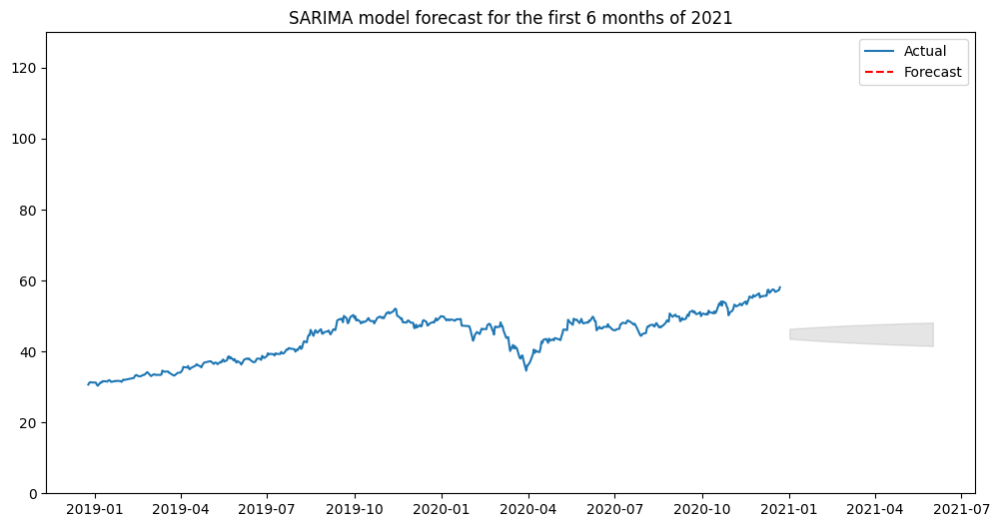

In [78]:
# Tách tập huấn luyện và tập kiểm tra
train, test = df_season[df_season.index < '2020-08-01'], df_season[df_season.index >= '2020-08-01']
print('train shape: ', train.shape)
print('test shape: ', test.shape)

# Huấn luyện mô hình SARIMA trên tập huấn luyện
model_sarima = pm.auto_arima(train, start_p=0, start_q=0,
                              max_p=5, max_q=5, m=12,
                              start_P=0, seasonal=True,
                              d=0, D=0, trace=True,
                              error_action='ignore',  
                              suppress_warnings=True, 
                              stepwise=True)

# In AIC của mô hình
print(model_sarima.aic())

# Dự đoán giá trị cho 6 tháng đầu tiên của năm 2021
n_pred_periods = 6  # Số lượng quý cần dự đoán cho 6 tháng
fitted, confint = model_sarima.predict(n_periods=n_pred_periods, return_conf_int=True)
date = pd.date_range('2021-01-01', periods=n_pred_periods, freq='MS')  # Từ tháng 1 đến tháng 6 năm 2021

# Tạo Series cho dự đoán
fitted_series = pd.Series(fitted, index=date)
lower = confint[:, 0]
upper = confint[:, 1]

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
plt.plot(df_season, label='Actual')
plt.plot(fitted_series, color='red', linestyle='--', label='Forecast')
plt.fill_between(date, lower, upper, color='grey', alpha=0.2)  # Tô màu dưới biểu đồ
plt.ylim((0, 130))
plt.legend()
plt.title('SARIMA model forecast for the first 6 months of 2021')
plt.show()

In [79]:
def _measure_metric(y, yhat):
  e = y-yhat
  mse=np.mean(e**2)
  rmse=np.sqrt(mse)
  mae=np.mean(np.abs(e))
  mape=np.mean(e/y)

  print('Mean Square Error: {}'.format(mse))
  print('Root Mean Square Error: {}'.format(rmse))
  print('Mean Absolute Error: {}'.format(mae))
  print('Mean Absolute Percentage Error: {}'.format(mape))
  return mse, rmse, mae, mape

mse, rmse, mae, mape=_measure_metric(test.values[0], fitted)

Mean Square Error: 0.08766797131221753
Root Mean Square Error: 0.29608777636406663
Mean Absolute Error: 0.29316408300365754
Mean Absolute Percentage Error: 0.006485931039903928
